In [2]:
# Using airplane data, compare the measured phases on baselines to expected phases from the airplanes
#
# Author: Brian Pitzel
# Date Created: 5 February 2025
# Date Modified: 5 February 2025

import numpy as np
import h5py 
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import datetime
import csv
import glob
import pickle
import pymap3d as pm
from datetime import timezone
import warnings
import helpers.airplanes as ap
warnings.filterwarnings("ignore", category=FutureWarning)

%matplotlib widget


In [51]:
def load_level1_xspectra(files, t_start, t_end):
    print(t_start, t_end)

    
    ti_string = f'{t_start.hour:02d}{t_start.minute:02d}{t_start.second:02d}000'
    tf_string = f'{t_end.hour:02d}{t_end.minute:02d}{t_end.second:02d}000'

    xspectra = []
    time_array = []
    
    for file in files:
        try:
            f = h5py.File(file)
        except Exception as e:
            #print(f'Excepted {e}\nContinuing...')
            continue
        
        for key in f['data'].keys():
            if key < ti_string or key > tf_string:
                continue

            if not f['data'][key]['data_flag'][:]:
                continue

            xspectra.append(f['data'][key]['xspectra'][:])
            time = f['data'][key]['time'][:]
            hour = time[0]
            minute = time[1]
            second = int(time[2] / 1e3)

            temp_time_array = []
            for target in range(xspectra[-1].shape[0]):
                temp_time_array.append(datetime.datetime(t_start.year, t_start.month, t_start.day, hour, minute, second))
            time_array.append(np.array(temp_time_array))
        
        f.close()

    if xspectra != []:
        xspectra = np.concatenate(xspectra, axis=0)
        time_array = np.concatenate(time_array, axis=0)
        print(xspectra.shape)
        return xspectra, time_array
    else:
        return 0, 0


In [52]:
from sklearn.linear_model import LinearRegression

# Function to perform linear regression with a known slope
def linear_regression_with_known_slope(x, y, m):
    # Reshape x to be a 2D array for sklearn
    x = x.reshape(-1, 1)
    
    # Create the design matrix with the known slope
    X_design = x * m
    
    # Perform linear regression with the design matrix
    reg = LinearRegression(fit_intercept=True).fit(X_design, y)
    
    # Get the y-intercept (intercept_)
    b = reg.intercept_
    
    return b

# Function to perform linear regression with a known slope
def linear_regression_with_known_slope2(x, y, m):
    A = np.ones((x.shape[0], 1))
    
    y_adjusted = y - m * x
    
    # Get the y-intercept (intercept_)
    b, residuals, _, _ = np.linalg.lstsq(A, y_adjusted, rcond=None)
    
    return b, residuals

In [53]:
def datetime_to_seconds_since_epoch(datetime_array):
    # Convert each datetime to seconds since epoch
    seconds_since_epoch = np.array([int(dt.timestamp()) for dt in datetime_array])
    return seconds_since_epoch

In [54]:
def unwrap_phase(phase, tol):
    # wherever the difference in phase is equal to or greater than 360, ALL values past that point should be adjusted.
    # imagine a ripple effect down the sequence
    last_point = False
    while not last_point:
        # unwrap the phase of a time sequence of phases
        phase_diff = np.diff(phase)
        for i in range(phase_diff.shape[0]):
            if phase_diff[i] >= 360 - tol:
                phase[i+1:] = phase[i+1:] - 360
                break
            elif phase_diff[i] <= -360 + tol:
                phase[i+1:] = phase[i+1:] + 360
                break
            last_point = True        
    return phase


In [58]:
SMALL_SIZE = 30 #38
MEDIUM_SIZE = 35 #42
BIGGER_SIZE = 50 #56

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
fig_width_inches = 17
fig_height_inches = 10

In [60]:
# get the level 2 files
y = 2021
m = 3
d = 13
n_days = 1 # how many days starting at and including d-day
h = 0
n_hours = 24
level1_files = []
for i in range(n_days):
    for j in range(n_hours):
        level1_files.append(f'/mnt/NAS/airplane-data/L1/{y}/{m:02d}/{y}_{m:02d}_{(d+i):02d}/ib3d_normal_01dB_1000ms_{y}_{m:02d}_{(d+i):02d}_{(h+j):02d}_prelate_bakker.h5')
print(level1_files)


level2_files = []
for i in range(n_days):
    #level2_files.append(f'/mnt/NAS/airplane-data/L2-narrow1/{y}/{m:02d}/{y}_{m:02d}_{(d+i):02d}/ib3d_normal_swht_{y}_{m:02d}_{(d+i):02d}_prelate_bakker.h5')
    #level2_files.append(f'/mnt/NAS/airplane-data/L2-calibrated1/{y}/{m:02d}/{y}_{m:02d}_{(d+i):02d}/ib3d_normal_swht_{y}_{m:02d}_{(d+i):02d}_prelate_bakker.h5')
    #level2_files.append(f'/mnt/NAS/airplane-data/L2-recalibrated1/{y}/{m:02d}/{y}_{m:02d}_{(d+i):02d}/ib3d_normal_swht_{y}_{m:02d}_{(d+i):02d}_prelate_bakker.h5')
    #level2_files.append(f'/mnt/NAS/airplane-data/L2-recalibrated2_1/{y}/{m:02d}/{y}_{m:02d}_{(d+i):02d}/ib3d_normal_swht_{y}_{m:02d}_{(d+i):02d}_prelate_bakker.h5')
    #level2_files.append(f'/mnt/NAS/airplane-data/L2-recalibrated3_1/{y}/{m:02d}/{y}_{m:02d}_{(d+i):02d}/ib3d_normal_swht_{y}_{m:02d}_{(d+i):02d}_prelate_bakker.h5')
    level2_files.append(f'/mnt/NAS/airplane-data/L2-antenna-calibrated_1/{y}/{m:02d}/{y}_{m:02d}_{(d+i):02d}/ib3d_normal_swht_{y}_{m:02d}_{(d+i):02d}_prelate_bakker.h5')
    #level2_files.append(f'/mnt/NAS/airplane-data/L2-antenna-calibrated-180_1/{y}/{m:02d}/{y}_{m:02d}_{(d+i):02d}/ib3d_normal_swht_{y}_{m:02d}_{(d+i):02d}_prelate_bakker.h5')
    #level2_files.append(f'/mnt/NAS/airplane-data/L2-pos-antenna-calibrated-180_1/{y}/{m:02d}/{y}_{m:02d}_{(d+i):02d}/ib3d_normal_swht_{y}_{m:02d}_{(d+i):02d}_prelate_bakker.h5')

print(level2_files)

# descriptor for this run
descriptor = 'Phase Comparison'

# set up vectorized timestamp converter
vutcfromtimestamp = np.vectorize(datetime.datetime.utcfromtimestamp)
vfromtimestamp = np.vectorize(datetime.datetime.fromtimestamp)


# time interval of interest
t_start = [y,m,d,h,0,0]
t_end   = [y,m,d+n_days-1,h+n_hours-1,59,59]

start_time = datetime.datetime(t_start[0], t_start[1], t_start[2], t_start[3], t_start[4], t_start[5])# - datetime.timedelta(hours=6)
end_time = datetime.datetime(t_end[0], t_end[1], t_end[2], t_end[3], t_end[4], t_end[5])# - datetime.timedelta(hours=6)

['/mnt/NAS/airplane-data/L1/2021/03/2021_03_13/ib3d_normal_01dB_1000ms_2021_03_13_00_prelate_bakker.h5', '/mnt/NAS/airplane-data/L1/2021/03/2021_03_13/ib3d_normal_01dB_1000ms_2021_03_13_01_prelate_bakker.h5', '/mnt/NAS/airplane-data/L1/2021/03/2021_03_13/ib3d_normal_01dB_1000ms_2021_03_13_02_prelate_bakker.h5', '/mnt/NAS/airplane-data/L1/2021/03/2021_03_13/ib3d_normal_01dB_1000ms_2021_03_13_03_prelate_bakker.h5', '/mnt/NAS/airplane-data/L1/2021/03/2021_03_13/ib3d_normal_01dB_1000ms_2021_03_13_04_prelate_bakker.h5', '/mnt/NAS/airplane-data/L1/2021/03/2021_03_13/ib3d_normal_01dB_1000ms_2021_03_13_05_prelate_bakker.h5', '/mnt/NAS/airplane-data/L1/2021/03/2021_03_13/ib3d_normal_01dB_1000ms_2021_03_13_06_prelate_bakker.h5', '/mnt/NAS/airplane-data/L1/2021/03/2021_03_13/ib3d_normal_01dB_1000ms_2021_03_13_07_prelate_bakker.h5', '/mnt/NAS/airplane-data/L1/2021/03/2021_03_13/ib3d_normal_01dB_1000ms_2021_03_13_08_prelate_bakker.h5', '/mnt/NAS/airplane-data/L1/2021/03/2021_03_13/ib3d_normal_01dB_

/mnt/NAS/airplane-data/L2-antenna-calibrated_1/2021/03/2021_03_13/ib3d_normal_swht_2021_03_13_prelate_bakker.h5
(3194,)


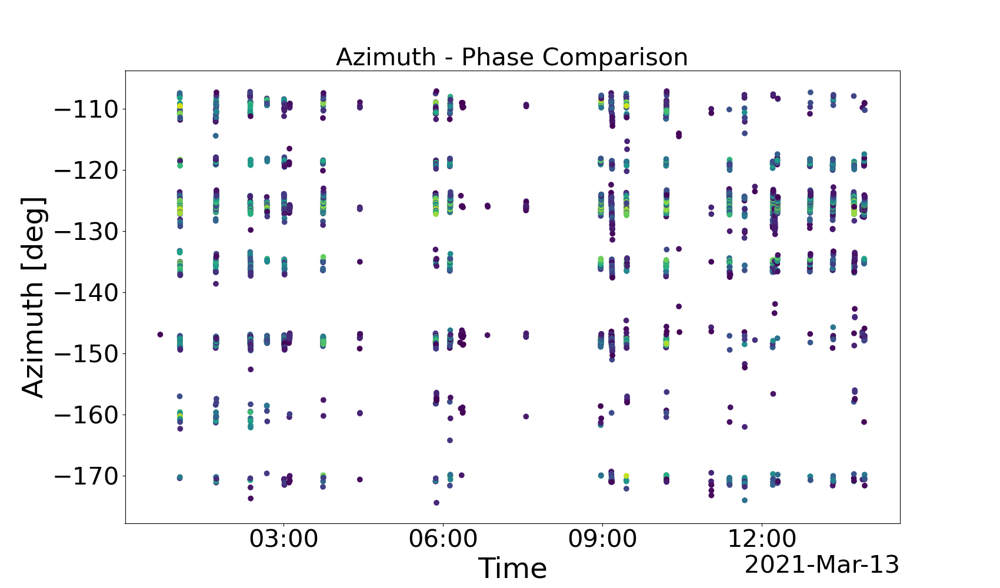

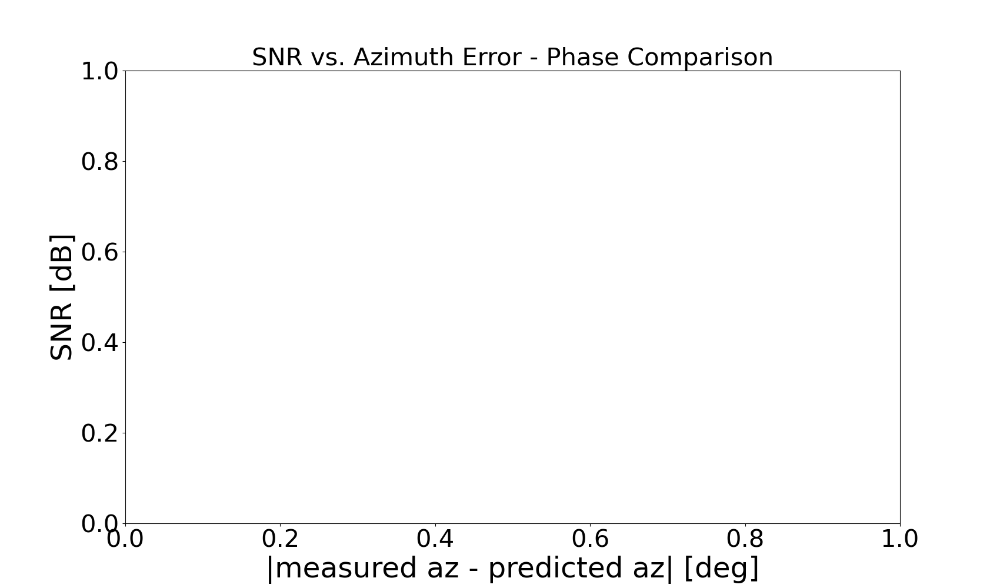

In [61]:
plt.close('all')
# set up axes
locator = mdates.AutoDateLocator(minticks=3, maxticks=7)
formatter = mdates.ConciseDateFormatter(locator)

fig_az, ax_az = plt.subplots()
fig_az.set_size_inches(fig_width_inches, fig_height_inches)
ax_az.set_ylabel('Azimuth [deg]')
ax_az.set_xlabel('Time')
ax_az.set_title(f'Azimuth - {descriptor}')
ax_az.xaxis.set_major_locator(locator)
ax_az.xaxis.set_major_formatter(formatter)

fig_snr, ax_snr = plt.subplots()
fig_snr.set_size_inches(fig_width_inches, fig_height_inches)
ax_snr.set_ylabel('SNR [dB]')
ax_snr.set_xlabel('|measured az - predicted az| [deg]')
ax_snr.set_title(f'SNR vs. Azimuth Error - {descriptor}')

for file in level2_files:
    print(file)
    try:
        f = h5py.File(file)
    except Exception as e:
        print(f'Excepted {e}\nContinuing...')
        continue
    altitude = f['data']['altitude'][:]
    azimuth = f['data']['azimuth'][:]
    doppler_shift = f['data']['doppler_shift'][:]
    elevation = f['data']['elevation'][:]
    latitude = f['data']['latitude'][:]
    longitude = f['data']['longitude'][:]
    rf_distance = f['data']['rf_distance'][:]
    slant_range = f['data']['slant_range'][:]
    snr_db = f['data']['snr_db'][:]
    time = f['data']['time'][:]
    utc_time = vutcfromtimestamp(time)
    print(azimuth.shape)
    forbidden_days = [12, 14]
    if utc_time[0].day in forbidden_days:
        continue
    
    time_filter = (utc_time <= end_time) & (utc_time >= start_time)

    for k in range(utc_time.shape[0]):
        utc_time[k] = utc_time[k].replace(tzinfo=timezone.utc)
    #print(rf_distance[time_filter])
    #print(altitude[time_filter])
    #range_filter = (rf_distance < 256) & (rf_distance > 246)
    #time_filter = time_filter & range_filter

    
    # plot az and el / time
    ax_az.scatter(utc_time[time_filter], azimuth[time_filter], c=snr_db[time_filter])
    
    f.close()

2021-03-13 01:02:38 2021-03-13 01:03:16
(136, 45)
2021-03-13 01:43:14 2021-03-13 01:44:09
(188, 45)
2021-03-13 02:22:06 2021-03-13 02:22:49
(137, 45)
2021-03-13 03:00:19 2021-03-13 03:01:03
(145, 45)
2021-03-13 03:00:19 2021-03-13 03:01:03
(145, 45)
2021-03-13 03:05:58 2021-03-13 03:07:03
(85, 45)
2021-03-13 03:44:20 2021-03-13 03:45:00
(140, 45)
2021-03-13 05:51:29 2021-03-13 05:52:38
(141, 45)
2021-03-13 06:07:33 2021-03-13 06:08:23
(174, 45)
2021-03-13 06:19:59 2021-03-13 06:23:02
(35, 45)
2021-03-13 08:57:53 2021-03-13 08:58:41
(172, 45)
2021-03-13 08:57:53 2021-03-13 08:58:41
(172, 45)
2021-03-13 09:09:40 2021-03-13 09:11:15
(2484, 45)
2021-03-13 09:26:46 2021-03-13 09:27:50
(480, 45)
2021-03-13 11:23:01 2021-03-13 11:23:39
(132, 45)
2021-03-13 11:24:23 2021-03-13 11:24:24
(2, 45)
2021-03-13 12:12:02 2021-03-13 12:12:46
(160, 45)
2021-03-13 12:12:02 2021-03-13 12:12:46
(160, 45)
2021-03-13 12:14:05 2021-03-13 12:14:52
(109, 45)
2021-03-13 12:14:05 2021-03-13 12:14:52
(109, 45)
202

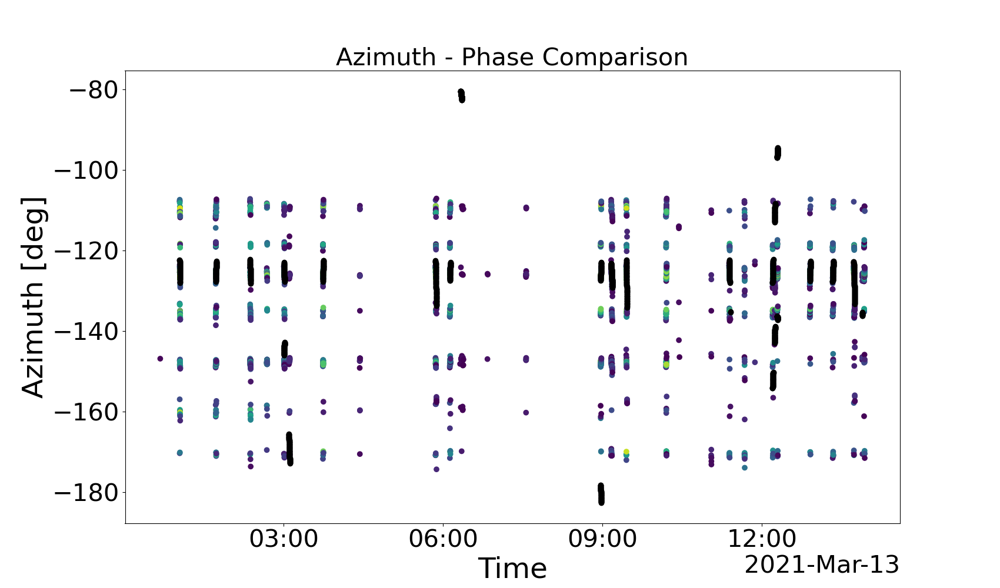

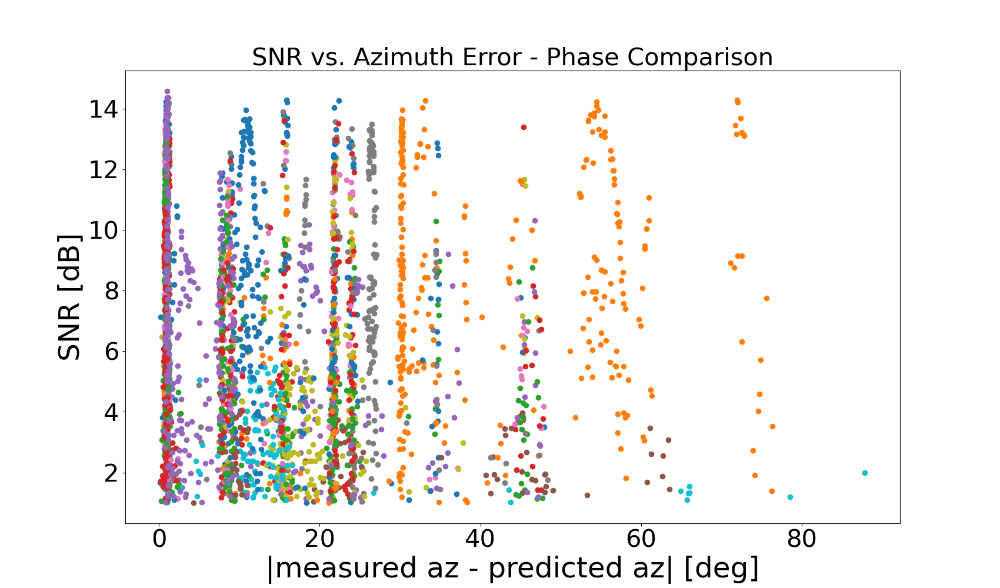

In [62]:
# load in the aircraft data and calculate the azimuth/elevation
#plt.close('all')
# set aircraft boundaries if downloading the data
bounds = (-109.375, 50.771, -106.0, 52.765) # west, south, east, north

#aircrafts_dbs = ap.load_airplane_data('aircrafts_dbs_2024-08-01_to_2024-08-15.pckl')
aircrafts_dbs = ap.retrieve_airplane_data(utc_time, time_filter, bounds)

plotting = False

if plotting:
    ax = []
    fig = []
    i = 0
    for antenna1 in range(10):
        for antenna2 in range(antenna1+1, 10):
            figg, axx = plt.subplots()
            figg.set_size_inches(fig_width_inches, fig_height_inches)
            axx.set_ylabel('Baseline Phase [deg]')
            axx.set_xlabel('Time ')
            axx.set_title(f'Baseline {antenna1}-{antenna2} {descriptor}')
            axx.xaxis.set_major_locator(locator)
            axx.xaxis.set_major_formatter(formatter)
            fig.append(figg)
            ax.append(axx)
            i += 1


total_corrections = []
airplane_idx = 0
for db in aircrafts_dbs:
    if airplane_idx == 14:
        airplane_idx += 1
        continue
    
    # db is a database of every airplane in the timeframe.
    if db == None:
        continue
    # db[i].data.long/lat is the time series of data for one airplane (i)

    success = False
    for i in range(len(db)): # db[i] is a single airplane in the timeframe.
        start_idx = db[i].data.index[0]
        end_idx = db[i].data.index[-1]
        ti = db[i].data.timestamp[start_idx]
        ti = ti.replace(tzinfo=None)
        tf = db[i].data.timestamp[end_idx]
        tf = tf.replace(tzinfo=None)

        if tf < start_time:
            continue
        if ti > end_time:
            break
        
        # find az/el from lat/long of airplane
        az, el, slant_range = ap.find_aer_from_receiver(db[i].data.latitude, db[i].data.longitude, db[i].data.altitude / 3.281)
        #az = np.where(az > 180.0, az - 360.0, az)
        range_filter = (slant_range < 150e3) & (slant_range > 70e3)# & (az < -120)
        az = az[range_filter]
        el = el[range_filter]
        time = db[i].data.timestamp[range_filter]

        if(time.shape[0] == 0):
            continue
        
        az -= 360
        
        # plot snr vs azimuth error
        az_errors = []
        snrs = []

        for k in range(db[i].data.index[range_filter][0], db[i].data.index[range_filter][-1]):
            this_time = utc_time == time[k].to_pydatetime().replace(tzinfo=timezone.utc)
            
            az_error = np.abs(azimuth[this_time] - az[k])
            snrs.append(snr_db[this_time])
            az_errors.append(az_error)
        snrs = np.hstack(snrs)
        az_errors = np.hstack(az_errors)
        ax_snr.scatter(az_errors, snrs)
        
        # plot az vs time
        ax_az.scatter(time, az, c='black')
        az = -az + 90 # convert to wrt East angles

        # look at individual baselines
        xspectra, data_time = load_level1_xspectra(level1_files, ti, tf)

        corrections_this_airplane = [] # a full set of baseline corrections from a single airplane
        
        baseline = 0
        for antenna1 in range(10):
            for antenna2 in range(antenna1+1, 10):
                airplane_phase = ap.calculate_baseline_phase(antenna1, antenna2, az, el)
                airplane_phase = np.rad2deg(airplane_phase)
                
                vis_phase = np.rad2deg(np.angle(xspectra[:, baseline]))
                
                # DON'T wrap the phase from the airplane
                #while np.any(airplane_phase < -180):
                #    airplane_phase[airplane_phase < -180] = airplane_phase[airplane_phase < -180] + 360
                #while np.any(airplane_phase > 180):
                #    airplane_phase[airplane_phase > 180] = airplane_phase[airplane_phase > 180] - 360
    
                # DO unwrap the phase from the visibilities
                #vis_phase = np.unwrap(vis_phase, period=360)
                tol = 0
                vis_phase_saved = vis_phase
                vis_phase = unwrap_phase(vis_phase, tol=tol)
                
                # for the airplane, calculate a linear best fit
                timestamps_plane = datetime_to_seconds_since_epoch(time.dt.to_pydatetime())
                m, b_plane = np.polyfit(timestamps_plane, airplane_phase, deg=1)
                # using the slope of that best fit, do least squares regression on the measured data
                # this will find the y-intercept that best matches the measured data to a line with the slope m
                timestamps_data = datetime_to_seconds_since_epoch(data_time)
                b_data, residuals = linear_regression_with_known_slope2(timestamps_data, vis_phase, m)
                R2 = 1 - residuals / (vis_phase.shape[0] * vis_phase.var())

                np.save(f'data-magnus-day-azimuth-corrected/airplane_phase{antenna1}{antenna2}-plane{airplane_idx}.npy', airplane_phase)
                np.save(f'data-magnus-day-azimuth-corrected/vis_phase{antenna1}{antenna2}-plane{airplane_idx}.npy', vis_phase_saved)
                np.save(f'data-magnus-day-azimuth-corrected/airplane_time{antenna1}{antenna2}-plane{airplane_idx}.npy', timestamps_plane)
                np.save(f'data-magnus-day-azimuth-corrected/vis_time{antenna1}{antenna2}-plane{airplane_idx}.npy', timestamps_data)
                
                # plot the predicted airplane baseline phase
                if plotting:
                    ax[baseline].scatter(time, airplane_phase, c='black')
                
                # plot the best fit line for the predicted baseline phase
                x = np.array([timestamps_plane[0], timestamps_plane[-1]])
                y = m * x + b_plane
                y1 = y
                x = vutcfromtimestamp(x)
                if plotting:
                    ax[baseline].plot(x, y, c='black')
                
                # plot the measured visibility phase and it's best fit line                
                if np.all(vis_phase) != 0:

                    x = np.array([timestamps_data[0], timestamps_data[-1]])
                    y = m * x + b_data
                    y2 = y
                    correction = (y2-y1)[0]
                    x = vfromtimestamp(x) # don't use vutcfromtimestamp here because the data is already in utc
                    if plotting:
                        ax[baseline].plot(x, y)#-correction)
                        ax[baseline].scatter(data_time, vis_phase, label=f'R2 = {R2[0]}')#-correction)

                    corrections_this_airplane.append(correction)

                
                baseline += 1
                
        corrections_this_airplane = np.array(corrections_this_airplane)
        total_corrections.append(corrections_this_airplane)
        
        success = True
        airplane_idx += 1
    #if success:
    #    break

total_corrections = np.array(total_corrections)

if plotting:
    i = 0
    for antenna1 in range(10):
        for antenna2 in range(antenna1+1, 10):
            #ax[i].set_xlim([datetime.datetime(2021, 3, 13, 1, 2, 35), datetime.datetime(2021, 3, 13, 1, 3, 20)])    
            #ax[i].set_ylim([-10000, 10000])
            fig[i].legend()
            fig[i].savefig(f'airplane2/airplane-phase-baseline{antenna1}{antenna2}.png', dpi=300)
            fig[i].set_size_inches(fig_width_inches, fig_height_inches)
            fig[i].show()
            i += 1
            
fig_az.show()
fig_snr.show()

In [31]:
# save plots for individual airplane

i = 0
for antenna1 in range(10):
    for antenna2 in range(antenna1+1, 10):
        ax[i].set_xlim([datetime.datetime(2021, 3, 13, 13, 19, 40), datetime.datetime(2021, 3, 13, 13, 20, 50)])    
        ax[i].set_ylim([-180, 180])
        fig[i].savefig(f'airplane2/airplane-phase-baseline{antenna1}{antenna2}.png', dpi=300)
        fig[i].set_size_inches(fig_width_inches, fig_height_inches)
        i += 1

TypeError: 'Axes' object is not subscriptable

In [63]:
def unwrap_phase(phasec, tol):
    # wherever the difference in phase is equal to or greater than 180, ALL values past that point should be adjusted.
    # imagine a ripple effect down the sequence
    phase = np.copy(phasec)
    last_point = False
    while not last_point:
        # unwrap the phase of a time sequence of phases
        phase_diff = np.diff(phase)
        for i in range(phase_diff.shape[0]):
            if phase_diff[i] > 180 - tol:
                phase[i+1:] = phase[i+1:] - 360
                break
            elif phase_diff[i] < -180 + tol:
                phase[i+1:] = phase[i+1:] + 360
                break
            if i == phase_diff.shape[0]-1:
                last_point = True        
    return phase



def unwrap_phase2(phase, tol, n_points_median):
    # wherever the difference in phase is equal to or greater than 180, ALL values past that point should be adjusted.
    # imagine a ripple effect down the sequence
    last_point = False
    while not last_point:
        # unwrap the phase of a time sequence of phases
        for i in range(phase.shape[0]-1):
            end_idx = min(phase.shape[0], i+1)
            start_idx = max(0, i+1-n_points_median)
            median = np.median(phase[start_idx:end_idx])
            #print(start_idx, end_idx, phase[i+1], median)
            # if the next point is significantly different than the median of the n_points_median points before, adjust all points after
            if phase[i+1] - median >= 360 - tol:
                phase[i+1] = phase[i+1] - 360
                break
            elif phase[i+1] - median < -360 + tol:
                phase[i+1] = phase[i+1] + 360
                print('2', i+1)
                break

            # if we hit here, we have traversed the entire array successfully
            last_point = True        
    return phase



In [64]:
# manually adjust some plane phases for calibration purposes

/tmp/ipykernel_949156/2779076309.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figg, axx = plt.subplots()


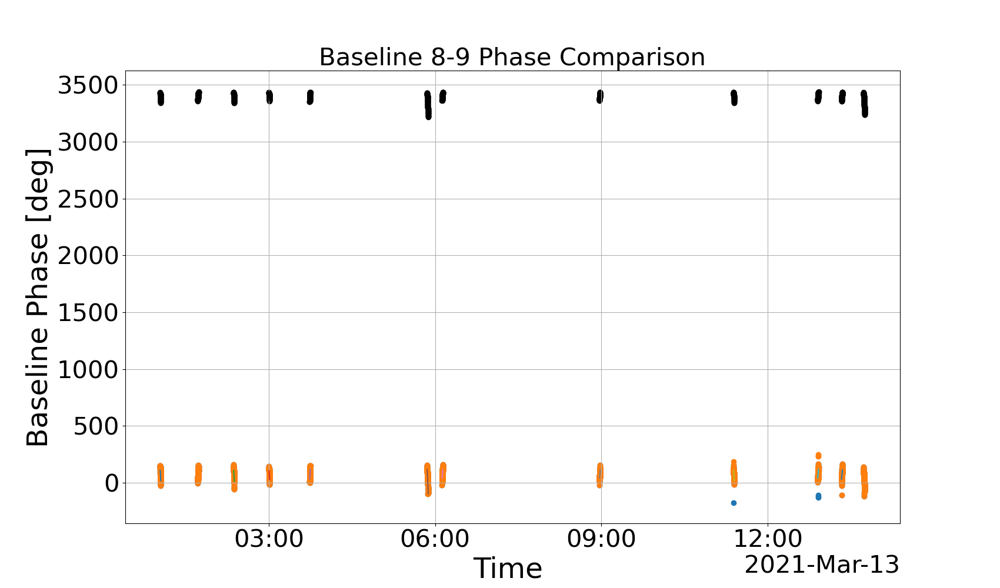

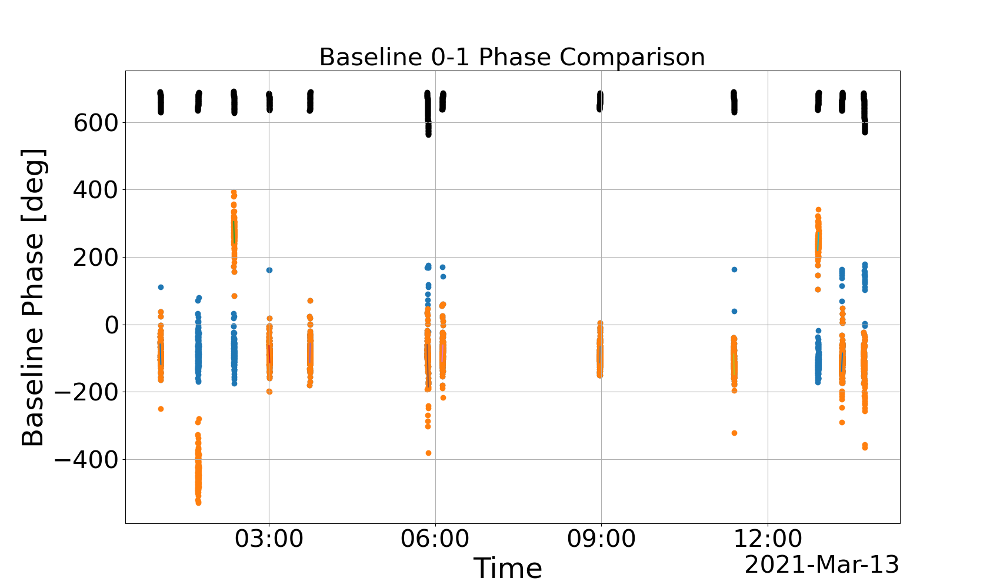

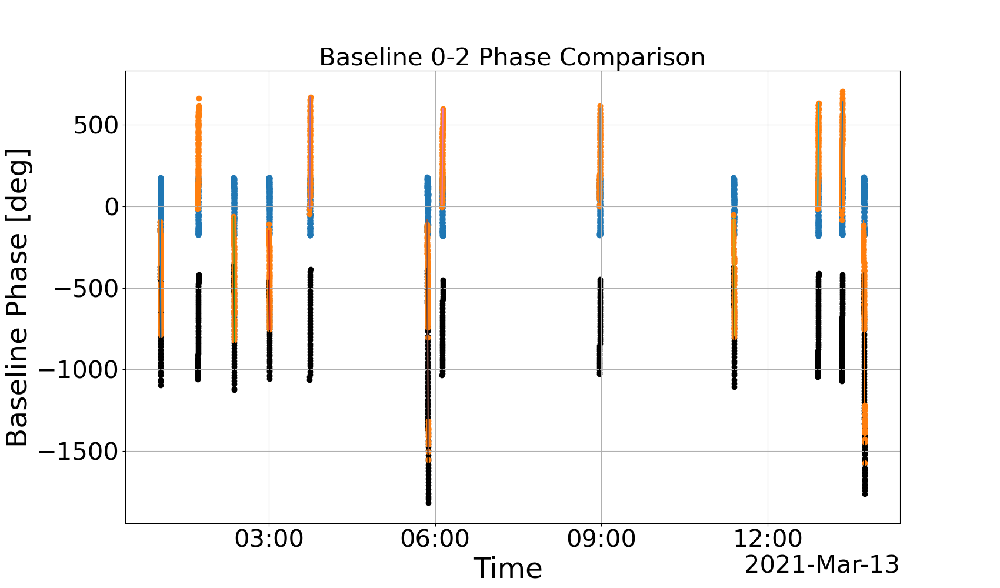

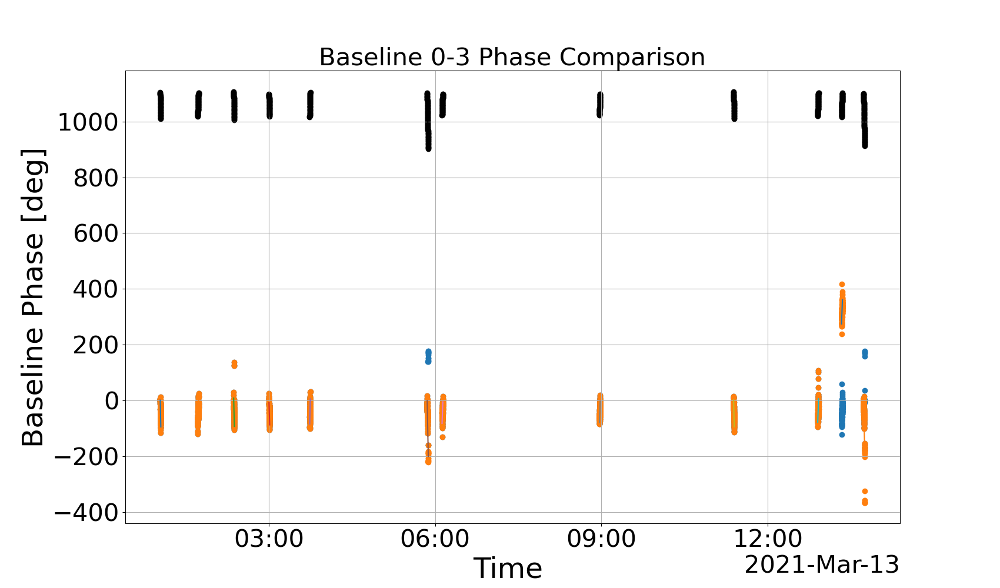

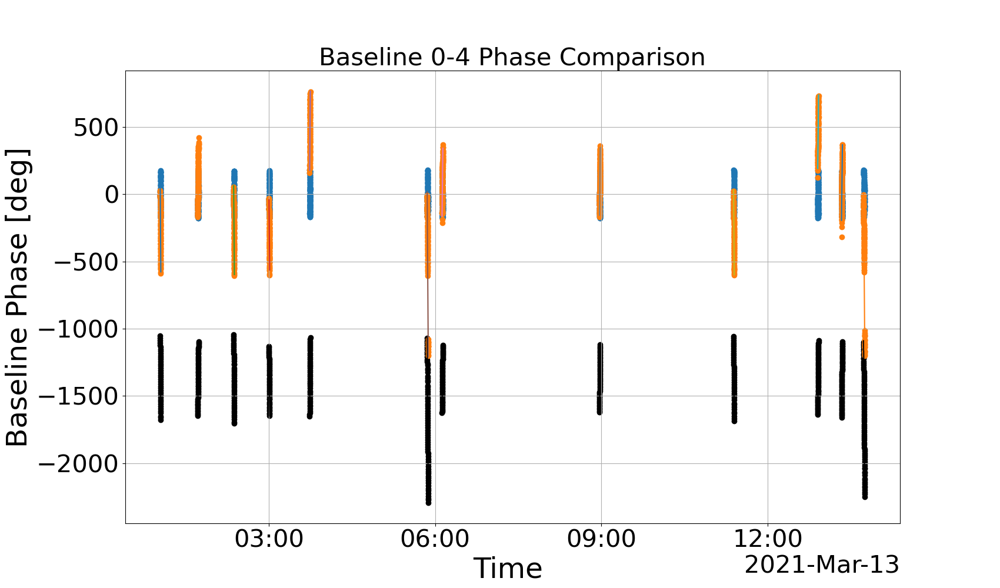

...

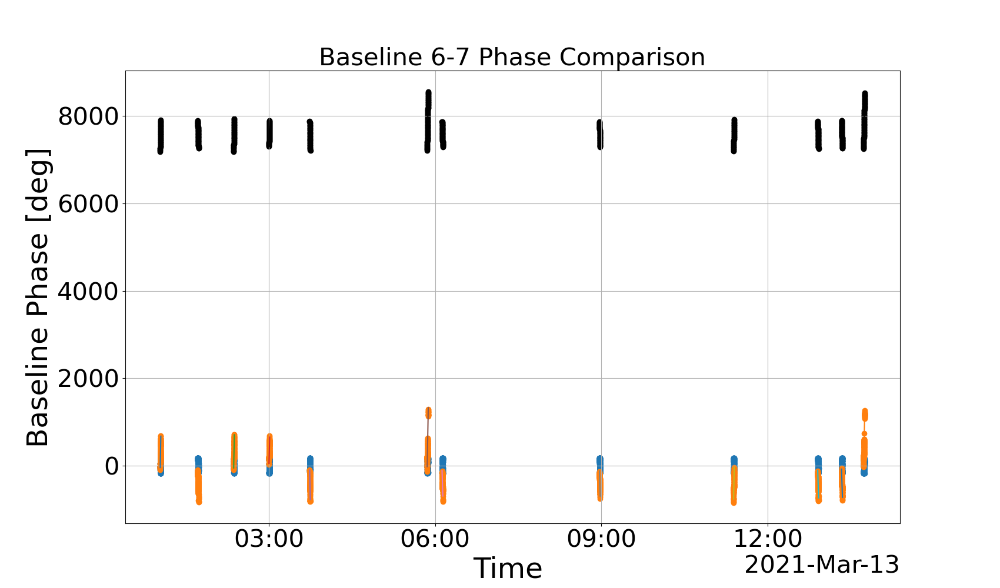

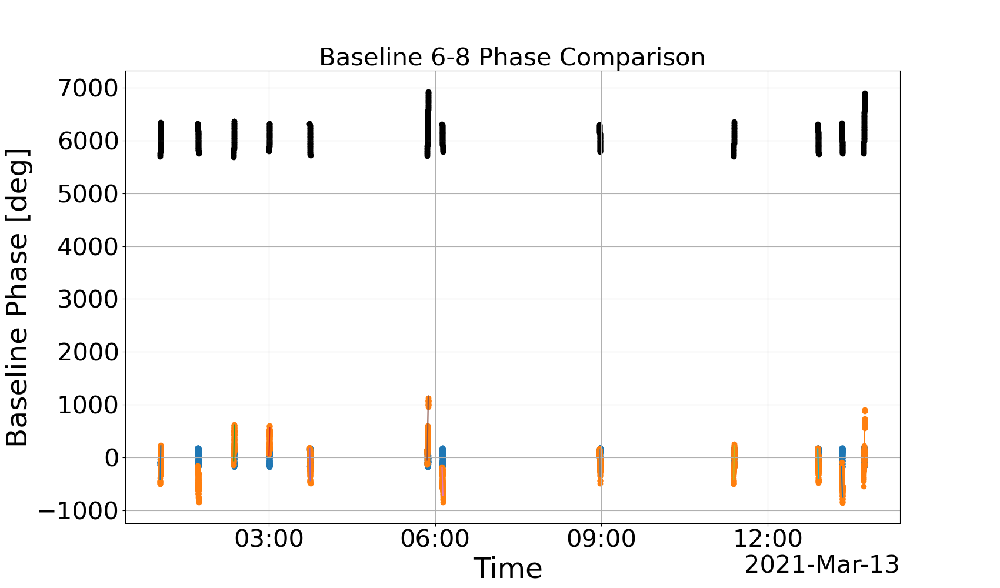

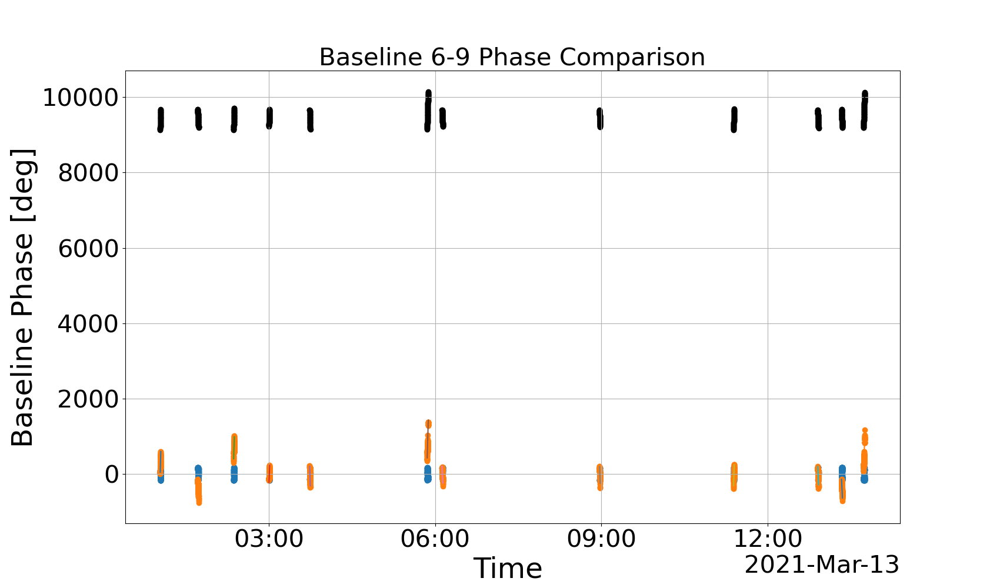

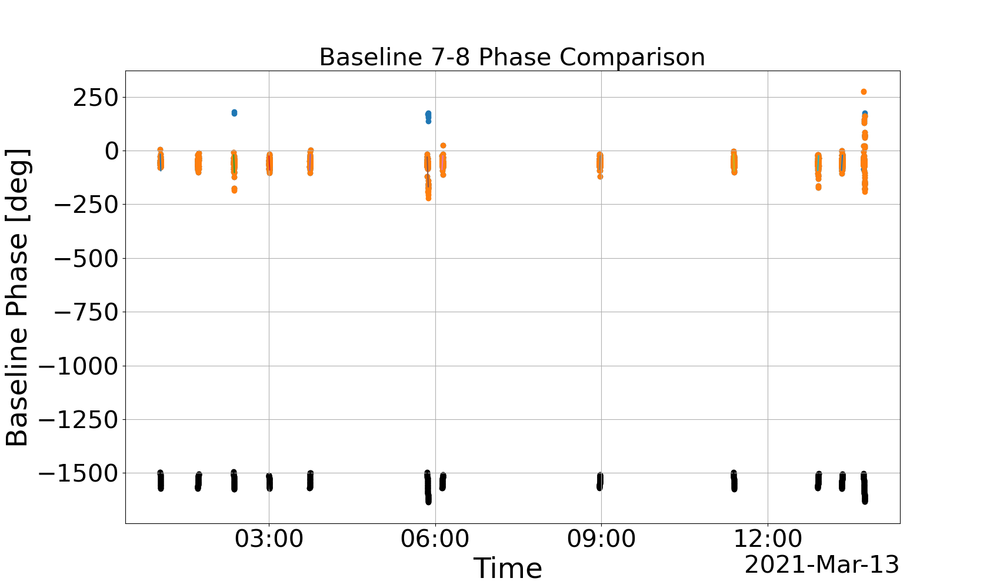

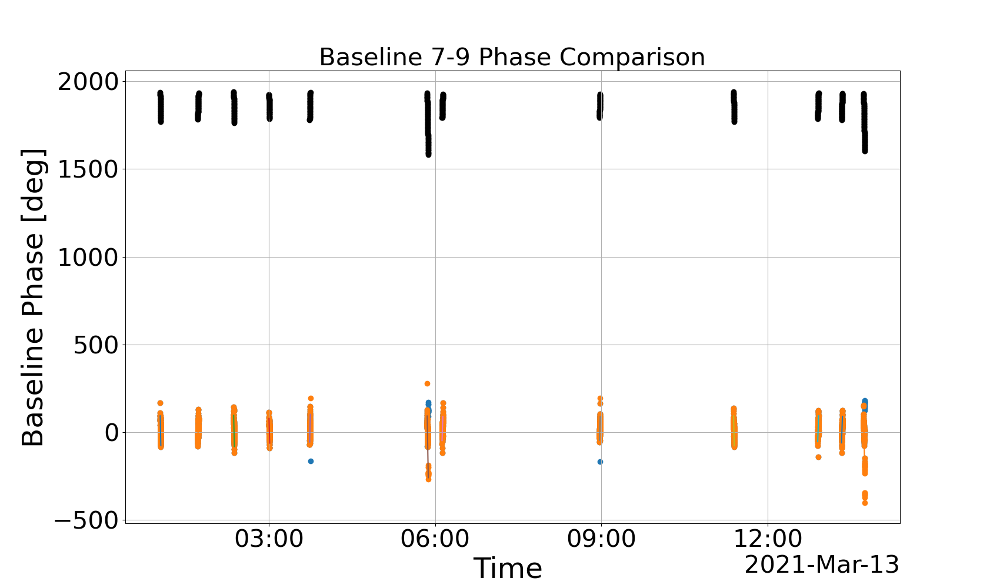

In [65]:
plt.close('all')

plotting = True

n_planes = 28

ax = []
fig = []
i = 0

baselines_to_plot = []
for antenna1 in range(10):
    for antenna2 in range(antenna1+1, 10):
        baselines_to_plot.append(f'{antenna1}{antenna2}')

if plotting:
    for antenna1 in range(10):
        for antenna2 in range(antenna1+1, 10):
            if f'{antenna1}{antenna2}' in baselines_to_plot:
                figg, axx = plt.subplots()
                figg.set_size_inches(fig_width_inches, fig_height_inches)
                axx.set_ylabel('Baseline Phase [deg]')
                axx.set_xlabel('Time ')
                axx.set_title(f'Baseline {antenna1}-{antenna2} {descriptor}')
                axx.xaxis.set_major_locator(locator)
                axx.xaxis.set_major_formatter(formatter)
                axx.grid()
                fig.append(figg)
                ax.append(axx)
                i += 1

total_corrections = []
planes = [0, 1, 2, 3, 6, 7, 8, 10, 15, 23, 24, 25] # all "good" planes
#planes = [0, 2, 3, 7, 15, 25] # all "down sloping" planes
#planes = [1, 6, 8, 10, 23, 24] # all "up sloping" planes
for plane in planes: # range(n_planes)
    corrections_this_airplane = [] # a full set of baseline corrections from a single airplane
    baseline = 0
    for antenna1 in range(10):
        for antenna2 in range(antenna1+1, 10):
            airplane_phase = np.load(f'data-magnus-day-azimuth-corrected/airplane_phase{antenna1}{antenna2}-plane{plane}.npy')
            vis_phase_original = np.load(f'data-magnus-day-azimuth-corrected/vis_phase{antenna1}{antenna2}-plane{plane}.npy')
            timestamps_plane = np.load(f'data-magnus-day-azimuth-corrected/airplane_time{antenna1}{antenna2}-plane{plane}.npy')
            timestamps_data = np.load(f'data-magnus-day-azimuth-corrected/vis_time{antenna1}{antenna2}-plane{plane}.npy')

            if f'{antenna1}{antenna2}' in baselines_to_plot:
                # unwrap the phase
                vis_phase = unwrap_phase(vis_phase_original, tol=0) #, n_points_median=1)
                
                # plot the predicted airplane phase
                if plotting:
                    ax[baseline].scatter(vutcfromtimestamp(timestamps_plane), airplane_phase, c='black')

                # for the airplane, calculate a linear best fit
                m, b_plane = np.polyfit(timestamps_plane, airplane_phase, deg=1)
                # using the slope of that best fit, do least squares regression on the measured data
                # this will find the y-intercept that best matches the measured data to a line with the slope m
                b_data, residuals = linear_regression_with_known_slope2(timestamps_data, vis_phase, m)
                R2 = 1 - residuals / (vis_phase.shape[0] * vis_phase.var())

                
                # now, for all points that could potentially be 360 out of phase upwards of the best fit line, pull them down
                # and ditto for the points 360 out of phase downwards

                # TODO: find a better way to iterate this, but it is still doing a good job
                n_to_shift = -1
                old_n_to_shift = -2
                while n_to_shift != old_n_to_shift: 
                    to_shift_down = (vis_phase - (m * timestamps_data + b_data)) > 180 
                    to_shift_up = (vis_phase - (m * timestamps_data + b_data)) < -181 
                    vis_phase[to_shift_down] = vis_phase[to_shift_down] - 360 
                    vis_phase[to_shift_up] = vis_phase[to_shift_up] + 360 
                    old_n_to_shift = n_to_shift
                    n_to_shift = np.count_nonzero(to_shift_down) + np.count_nonzero(to_shift_up)
                
                # recalculate the best fit line
                b_data, residuals = linear_regression_with_known_slope2(timestamps_data, vis_phase, m)
                R2 = 1 - residuals / (vis_phase.shape[0] * vis_phase.var())

                # plot the best fit line for the predicted phase
                x = np.array([timestamps_plane[0], timestamps_plane[-1]])
                y = m * x + b_plane
                y1 = y
                x = vutcfromtimestamp(x)
                if plotting:
                    ax[baseline].plot(x, y, c='black')
                
                # plot the measured visibility phase and it's best fit line                
                if np.all(vis_phase) != 0:
    
                    x = np.array([timestamps_data[0], timestamps_data[-1]])
                    y = m * x + b_data
                    y2 = y
                    correction = (y2-y1)[0]
                    x = vfromtimestamp(x) # don't use vutcfromtimestamp here because the data is already in utc
                    if plotting:
                        ax[baseline].plot(x, y) # best fit line
                        ax[baseline].scatter(vfromtimestamp(timestamps_data), vis_phase_original, c='tab:blue')#-correction)
                        ax[baseline].scatter(vfromtimestamp(timestamps_data), vis_phase, c='tab:orange')
                
                baseline += 1
            corrections_this_airplane.append(correction)
    total_corrections.append(np.array(corrections_this_airplane))
total_corrections = np.array(total_corrections)

plt.show('all')

In [68]:
# generate antenna based calibrations....

std_total_corrections = np.std(total_corrections[:, :]%360, axis=0)
idxs = np.argsort(std_total_corrections) # ordered indices of the lowest stdev of correction values

antenna_quality = np.zeros(10) # sum of stdevs for baselines containing antenna

# sum the stdevs for each antenna
for corr in range(idxs.shape[0]):
    baseline = 0
    for antenna1 in range(10):
        for antenna2 in range(antenna1+1, 10):
            antenna_quality[antenna1] += std_total_corrections[baseline]
            antenna_quality[antenna2] += std_total_corrections[baseline]
            #if baseline == idxs[corr]:
                #print(f'baseline {antenna1}{antenna2}\tidx {idxs[corr]}\tstdev {std_total_corrections[idxs[corr]]}')
            baseline += 1

# the best antenna is defined (by Brian...) as the one with the lowest sum of stdev
print(f'best antenna: {np.argsort(antenna_quality)[0]}')


# baselines manually chosen to generate antenna calibrations:
baselines = {'79': 0,
             '37': 0,
             '03': 0,
             '78': 0,
             '29': 0,
             '26': 0,
             '56': 0,
             '13': 0,
             '49': 0}
baseline = 0 
for antenna1 in range(10):
    for antenna2 in range(antenna1+1, 10):
        ant_str = f'{antenna1}{antenna2}'
        if ant_str in baselines.keys():
            baselines[ant_str] = averaged_corrections[baseline]
        baseline += 1

# manually generate the antenna calibrations
phi9 = 0
phi7 = baselines['79'] + phi9
phi8 = phi7 - baselines['78']
phi2 = baselines['29'] + phi9
phi6 = phi2 - baselines['26']
phi5 = baselines['56'] + phi6
phi4 = baselines['49'] + phi9
phi3 = baselines['37'] + phi7
phi1 = baselines['13'] + phi3 
phi0 = baselines['03'] + phi3

antenna_cals = np.zeros(10)
antenna_cals[0] = phi0
antenna_cals[1] = phi1
antenna_cals[2] = phi2
antenna_cals[3] = phi3
antenna_cals[4] = phi4
antenna_cals[5] = phi5
antenna_cals[6] = phi6
antenna_cals[7] = phi7
antenna_cals[8] = phi8
antenna_cals[9] = phi9

# generate baseline calibrations FROM the antenna calibrations
manual_corrections = np.zeros(45)
baseline = 0
for antenna1 in range(10):
    for antenna2 in range(antenna1+1, 10):
        manual_corrections[baseline] = antenna_cals[antenna1] - antenna_cals[antenna2]
        baseline += 1

print(manual_corrections%360)
print((averaged_corrections - (averaged_corrections[-1] - manual_corrections[-1]))%360)

best antenna: 9
[3.15820383e+02 3.15958852e+02 3.35410628e+02 2.04012729e+01
 3.27054694e+02 8.57103760e+00 3.12572050e+02 3.55062944e+02
 2.68643822e+02 1.38469705e-01 1.95902455e+01 6.45808903e+01
 1.12343111e+01 5.27506550e+01 3.56751668e+02 3.92425613e+01
 3.12823440e+02 1.94517758e+01 6.44424206e+01 1.10958414e+01
 5.26121853e+01 3.56613198e+02 3.91040916e+01 3.12684970e+02
 4.49906448e+01 3.51644066e+02 3.31604095e+01 3.37161422e+02
 1.96523158e+01 2.93233194e+02 3.06653421e+02 3.48169765e+02
 2.92170777e+02 3.34661671e+02 2.48242549e+02 4.15163439e+01
 3.45517357e+02 2.80082502e+01 3.01589129e+02 3.04001013e+02
 3.46491906e+02 2.60072785e+02 4.24908936e+01 3.16071772e+02
 2.73580878e+02]
[321.77141985 313.67363775 334.71843353  17.43966915 337.92750236
   5.84350053 310.95641126 350.39459597 265.09101485 352.58264889
  18.89805094  66.65204352   7.96917956  53.16394326   5.05773681
  41.51148481 313.86086687  20.07937568  63.85737174  20.16456549
  51.91999078 356.60029937  36.0

45


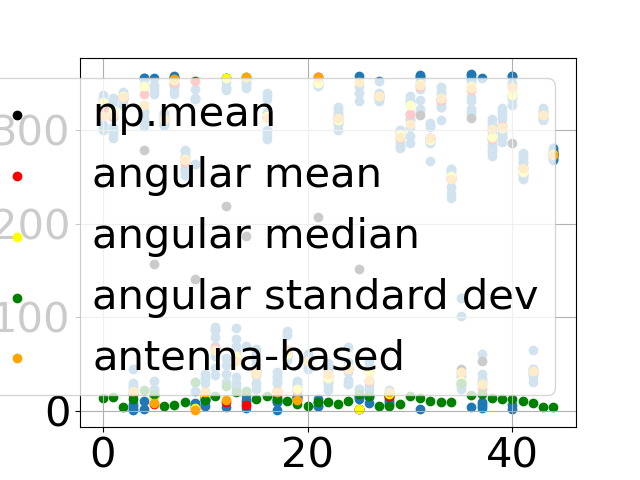

In [69]:
save_antenna_based_corrections = True

fig, ax = plt.subplots()
for plane in range(total_corrections.shape[0]):
    ax.scatter(np.arange(45), total_corrections[plane, :]%360, c='tab:blue')

ax.scatter(np.arange(45), np.mean(total_corrections%360, axis=0), c='black', label='np.mean')

averaged_corrections = []
median_corrections = []
stdev_corrections = []
first_airplane_corrections = total_corrections[0, :]
#planes = [0, 1, 2, 3, 6, 7, 8, 10, 15, 23, 24, 25]
print(total_corrections.shape[1])
for baseline in range(total_corrections.shape[1]): # total_corrections already has the planes selected from above
    median = ap.angular_median(np.deg2rad(total_corrections[:, baseline]%360))
    mean, stdev = ap.angular_mean_and_stdev(np.deg2rad(total_corrections[:, baseline]))
    averaged_corrections.append(np.rad2deg(mean))
    median_corrections.append(np.rad2deg(median))
    stdev_corrections.append(np.rad2deg(stdev))

averaged_corrections = np.array(averaged_corrections)
averaged_corrections[averaged_corrections < 0] += 360

stdev_corrections = np.array(stdev_corrections)

ax.scatter(np.arange(45), averaged_corrections, c='red', label='angular mean')
ax.scatter(np.arange(45), median_corrections, c='yellow', label='angular median')
ax.scatter(np.arange(45), stdev_corrections, c='green', label='angular standard dev')
ax.scatter(np.arange(45), manual_corrections%360, c='orange', label='antenna-based')
ax.legend()
ax.grid()

if save_antenna_based_corrections:
    np.save('first_airplane_corrections_azimuth_corrected.npy', first_airplane_corrections)
    np.save('airplane_corrections_azimuth_corrected.npy', averaged_corrections)
    np.save('airplane_corrections_antenna_based_azimuth_corrected.npy', manual_corrections)
    np.save('airplane_corrections_median_azimuth_corrected.npy', median_corrections)
plt.show()

In [70]:
(antenna_cals - antenna_cals[0])%360

array([  0.        ,  44.17961741,  44.0411477 ,  24.58937194,
       339.59872715,  32.94530634, 351.4289624 ,  47.42794973,
         4.93705612,  91.35617769])

In [46]:
a = np.load('airplane_corrections_antenna_based_azimuth_corrected.npy')
b = np.load('airplane_corrections_antenna_based.npy')

In [47]:
a  - b


array([ -57.10172843, -171.43754227,  -91.89439621,  -64.0094467 ,
        -24.72662538, -163.97066942, -204.32982621, -330.3733709 ,
         -6.631758  , -114.33581383,  -34.79266778,   -6.90771827,
         32.37510305, -106.86894099, -147.22809777, -273.27164247,
         50.46997043,   79.54314606,  107.42809556,  146.71091689,
          7.46687284,  -32.89228394, -158.93582864,  164.80578427,
         27.88494951,   67.16777083,  -72.07627321, -112.43543   ,
       -238.47897469,   85.26263821,   39.28282132,  -99.96122272,
       -140.3203795 , -266.3639242 ,   57.3776887 , -139.24404404,
       -179.60320083, -305.64674552,   18.09486738,  -40.35915678,
       -166.40270148,  157.33891142, -126.0435447 ,  197.69806821,
        323.7416129 ])

In [4]:

    """
    Finds the azimuth, elevation and range of a target or set of targets from the hard coded radar receiver
    Returns angles with respect to boresight, where negative is counter-clockwise from boresight
    """
# receiver geodetic coordinates
rx_lat = 52.243 # [deg]
rx_lon = -105.450 # [deg]
rx_alt = 0 # [m]

print(ap.find_aer_from_receiver(rx_lat, rx_lon, rx_alt))

(np.float64(89.60468885196947), np.float64(-0.3061545092441181), np.float64(68304.66292492556))


In [4]:
import numpy as np
np.load('airplane_corrections_antenna_based.npy')

array([-111.85086718,  497.9115204 ,  226.82964656,  321.24634787,
        357.40222738,  616.10792162,  425.80230659,  719.01262875,
        550.55339257,  609.76238758,  338.68051374,  433.09721505,
        469.25309456,  727.95878879,  537.65317377,  830.86349593,
        662.40425975, -271.08187384, -176.66517253, -140.50929303,
        118.19640121,  -72.10921381,  221.10110835,   52.64187216,
         94.41670131,  130.57258082,  389.27827505,  198.97266003,
        492.18298219,  323.723746  ,   36.15587951,  294.86157375,
        104.55595872,  397.76628088,  229.3070447 ,  258.70569424,
         68.40007921,  361.61040137,  193.15116519, -190.30561502,
        102.90470713,  -65.55452905,  293.21032216,  124.75108597,
       -168.45923618])